In [1]:
import os
import sys
import random
from PIL import Image
import numpy as np
import pandas as pd
#for image transform
#import cv2

import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['figure.figsize'] = [5, 5]
matplotlib.rcParams['figure.dpi'] = 200

import random
import time

sys.path.insert(1, '//workspace/dl2020')
#from model_loader_CP2 import *
from CP_helper_RCNN import *
from data_helper_RCNN import *
from auto_encoder import *

#from Unet import *

import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
import torch.utils.data


 
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor



from data_helper import UnlabeledDataset, LabeledDataset
from helper import collate_fn, draw_box

%load_ext autoreload
%autoreload 2
%load_ext autotime

In [2]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0);
image_folder = '../data'
annotation_csv = '../data/annotation.csv'

time: 3.99 ms


In [3]:
unlabeled_scene_index = np.arange(106)
# The scenes from 106 - 133 are labeled
# You should devide the labeled_scene_index into two subsets (training and validation)
labeled_scene_index = np.arange(106, 134)
train_labeled_scene_index, val_labeled_scene_index  = gen_train_val_index(labeled_scene_index)

time: 2.78 ms


In [41]:
val_labeled_scene_index

array([132, 121, 122, 114, 107, 119, 130, 118, 133])

time: 7.1 ms


In [4]:
transform = transforms.ToTensor()

kwargs = {
    #'first_dim': 'sample',
    'transform': transform,
    'image_folder': image_folder,
    'annotation_file': annotation_csv,
    'extra_info': True}

#dataset_train = LabeledDataset_RCNN (scene_index=train_labeled_scene_index, **kwargs)
#dataset_val = LabeledDataset_RCNN (scene_index=val_labeled_scene_index, **kwargs)

dataset_train = LabeledDataset(scene_index=train_labeled_scene_index, **kwargs)
dataset_val = LabeledDataset(scene_index=val_labeled_scene_index, **kwargs)





train_data_loader = torch.utils.data.DataLoader(
    dataset_train, batch_size=5, shuffle=False, num_workers=4,
    collate_fn=collate_fn)

val_data_loader = torch.utils.data.DataLoader(
    dataset_val, batch_size=1, shuffle=False, num_workers=4,
    collate_fn=collate_fn)

time: 810 ms


In [5]:
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection.rpn import RPNHead
def fr50_Model(pretrained = False):
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=pretrained) #true works
    # create an anchor_generator for the FPN
    # which by default has 5 outputs
    anchor_generator = AnchorGenerator(
        #sizes=tuple([(16, 32, 64, 128, 256, 512) for _ in range(5)]),
        sizes=tuple([(10, 15, 20, 30, 40) for _ in range(5)]),
         
        aspect_ratios=tuple([(0.25, 0.5, 1.0, 2.0) for _ in range(5)]))
    
    
    
    model.rpn.anchor_generator = anchor_generator

    # 256 because that's the number of features that FPN returns
    model.rpn.head = RPNHead(256, anchor_generator.num_anchors_per_location()[0])
    return model

time: 5.85 ms


In [6]:
#check one sample from train with batch size 20
# for i, (sample, old_targets, road_image, extra) in enumerate(train_data_loader): #, print_freq, header): 
        
#         images = sample
#         targets = trans_target(old_targets)
#         #print("images len {}, targets len {}".format(len(images), len(targets)))
#         #print("images[0] shape {}".format(images[0].shape)) # [6, 3, 256, 306]      
#         #images = list(image.to(device) for image in images)
#         #targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
#         break

time: 1.73 s


In [7]:
# normalize = torchvision.transforms.Normalize(mean=[0.6394939, 0.6755114, 0.7049375],
#                                  std=[0.31936955, 0.3117349 , 0.2953726 ])

# tt = transforms.Compose([transforms.Resize((800, 800)), transforms.ToTensor(), normalize]) 

# #images = [tt(sew_images(s)) for s in sample] #list of [3, 800, 800], should be 1 per patch
# targets = trans_target(old_targets)

time: 71.5 ms


In [8]:
#now check the autoencoder
AE = get_autoencoder()

time: 3.33 s


In [17]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

# our dataset has two classes only - background and person
num_classes = 2 #4 returned classifier as nan

# get the model using our helper function
#model = get_instance_segmentation_model(num_classes)
model = fr50_Model(False) #try False

# move model to the right device
model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0001, #reduce from 0.005 to help with the classifer loss = nan issue
                            momentum=0.9, weight_decay=0.0005)

# and a learning rate scheduler which decreases the learning rate by
# 10x every 3 epochs
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer,
                                               step_size=3,
                                               gamma=0.1)

time: 1.98 s


In [18]:
num_epochs = 20

for epoch in range(num_epochs):
    # train for one epoch, printing every 10 iterations
    train_one_epoch_FastRCNN(model, optimizer, train_data_loader, device, epoch, print_freq=100, 
                             mode = "autoencode", encoder = AE )
    # update the learning rate
    lr_scheduler.step()

Epoch: [0]  [  0/479]  eta: 0:52:19  lr: 0.000100  loss: 5.2095 (5.2095)  loss_classifier: 4.4446 (4.4446)  loss_box_reg: 0.0000 (0.0000)  loss_objectness: 0.6927 (0.6927)  loss_rpn_box_reg: 0.0722 (0.0722)  time: 6.5538  data: 1.1414  max mem: 3770
Epoch: [0]  [100/479]  eta: 0:12:48  lr: 0.000100  loss: 0.8920 (1.6421)  loss_classifier: 0.1544 (0.8478)  loss_box_reg: 0.0038 (0.0036)  loss_objectness: 0.6313 (0.6658)  loss_rpn_box_reg: 0.1201 (0.1249)  time: 2.0280  data: 0.0303  max mem: 4713
Epoch: [0]  [200/479]  eta: 0:09:32  lr: 0.000100  loss: 1.0168 (1.2695)  loss_classifier: 0.2681 (0.5049)  loss_box_reg: 0.0460 (0.0111)  loss_objectness: 0.4958 (0.6006)  loss_rpn_box_reg: 0.1926 (0.1530)  time: 2.2394  data: 0.0296  max mem: 5635
Epoch: [0]  [300/479]  eta: 0:06:09  lr: 0.000100  loss: 0.8408 (1.1440)  loss_classifier: 0.1917 (0.4079)  loss_box_reg: 0.0366 (0.0204)  loss_objectness: 0.4290 (0.5581)  loss_rpn_box_reg: 0.1586 (0.1576)  time: 2.0477  data: 0.0306  max mem: 5635


Epoch: [5]  [200/479]  eta: 0:09:27  lr: 0.000010  loss: 0.9463 (0.6955)  loss_classifier: 0.3251 (0.1793)  loss_box_reg: 0.1095 (0.0446)  loss_objectness: 0.3811 (0.3508)  loss_rpn_box_reg: 0.1558 (0.1208)  time: 2.2457  data: 0.0309  max mem: 7309
Epoch: [5]  [300/479]  eta: 0:06:09  lr: 0.000010  loss: 0.6836 (0.7453)  loss_classifier: 0.1550 (0.1996)  loss_box_reg: 0.0350 (0.0540)  loss_objectness: 0.3248 (0.3624)  loss_rpn_box_reg: 0.1423 (0.1294)  time: 2.0508  data: 0.0325  max mem: 7309
Epoch: [5]  [400/479]  eta: 0:02:42  lr: 0.000010  loss: 0.7747 (0.7269)  loss_classifier: 0.1988 (0.1960)  loss_box_reg: 0.0474 (0.0533)  loss_objectness: 0.3514 (0.3601)  loss_rpn_box_reg: 0.1329 (0.1176)  time: 2.1366  data: 0.0301  max mem: 7309
Epoch: [5]  [478/479]  eta: 0:00:02  lr: 0.000010  loss: 0.7947 (0.7212)  loss_classifier: 0.1843 (0.1888)  loss_box_reg: 0.0528 (0.0511)  loss_objectness: 0.3637 (0.3608)  loss_rpn_box_reg: 0.1611 (0.1204)  time: 2.1385  data: 0.0300  max mem: 7309


Epoch: [10]  [400/479]  eta: 0:02:41  lr: 0.000000  loss: 0.6778 (0.7186)  loss_classifier: 0.1798 (0.1969)  loss_box_reg: 0.0376 (0.0527)  loss_objectness: 0.3374 (0.3533)  loss_rpn_box_reg: 0.1384 (0.1158)  time: 2.1211  data: 0.0303  max mem: 7309
Epoch: [10]  [478/479]  eta: 0:00:02  lr: 0.000000  loss: 0.7042 (0.7070)  loss_classifier: 0.1742 (0.1863)  loss_box_reg: 0.0474 (0.0490)  loss_objectness: 0.3572 (0.3543)  loss_rpn_box_reg: 0.1491 (0.1173)  time: 2.1259  data: 0.0322  max mem: 7309
Epoch: [10] Total time: 0:16:13 (2.0329 s / it)
Epoch: [11]  [  0/479]  eta: 0:27:56  lr: 0.000000  loss: 0.5165 (0.5165)  loss_classifier: 0.1432 (0.1432)  loss_box_reg: 0.0435 (0.0435)  loss_objectness: 0.2853 (0.2853)  loss_rpn_box_reg: 0.0445 (0.0445)  time: 3.4994  data: 1.1890  max mem: 7309
Epoch: [11]  [100/479]  eta: 0:12:41  lr: 0.000000  loss: 0.6808 (0.6114)  loss_classifier: 0.1948 (0.1461)  loss_box_reg: 0.0547 (0.0310)  loss_objectness: 0.3077 (0.3384)  loss_rpn_box_reg: 0.1084 

Traceback (most recent call last):
  File "/root/miniconda/envs/gpu/lib/python3.7/multiprocessing/queues.py", line 242, in _feed
    send_bytes(obj)
  File "/root/miniconda/envs/gpu/lib/python3.7/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/root/miniconda/envs/gpu/lib/python3.7/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/root/miniconda/envs/gpu/lib/python3.7/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
BrokenPipeError: [Errno 32] Broken pipe


KeyboardInterrupt: 

time: 4h 3min 43s


In [19]:
#Evaluate on 1 sample

for i, (sample, old_targets, road_image, extra) in enumerate(val_data_loader): #, print_freq, header): 
        
        samp_pan = sew_images_panorm(sample) #convert to panoramic tensor
        samp_pan_t = torch.stack(samp_pan, dim = 0) #stack
        images = AE.return_image_tensor(samp_pan_t).to(device) #list of [3, 800, 800], should be 1 per patch
        targets = trans_target(old_targets)
        
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        break

time: 1.55 s


In [20]:
model.eval()
with torch.no_grad():
     prediction1 = model(images)

time: 573 ms


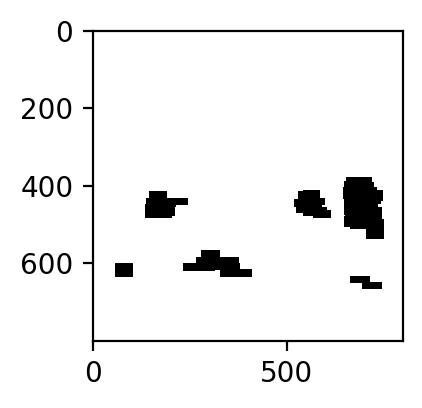

time: 450 ms


In [21]:
#plot prediction
 
road_img = gen_result_chart(prediction1[0])
fig, ax = plt.subplots(figsize=(2, 3))
#color_list = ['b', 'g', 'orange', 'c', 'm', 'y', 'k', 'w', 'r']
 
ax.imshow(road_img, cmap ='binary')

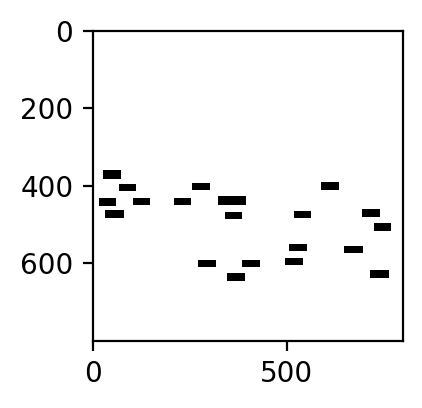

time: 606 ms


In [22]:
#plot target
 
road_img = gen_result_chart(targets [0])
fig, ax = plt.subplots(figsize = (2,3))
#color_list = ['b', 'g', 'orange', 'c', 'm', 'y', 'k', 'w', 'r']
 
ax.imshow(road_img, cmap ='binary')

In [23]:
#Evaluate on 1 sample

for i, (sample, old_targets, road_image, extra) in enumerate(val_data_loader): #, print_freq, header): 
        
        samp_pan = sew_images_panorm(sample) #convert to panoramic tensor
        samp_pan_t = torch.stack(samp_pan, dim = 0) #stack
        images = AE.return_image_tensor(samp_pan_t).to(device) #list of [3, 800, 800], should be 1 per patch
        targets = trans_target(old_targets)
        
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        if i ==1:
            break

time: 1.3 s


In [24]:
 model.eval()
with torch.no_grad():
     prediction2 = model(images)

time: 94 ms


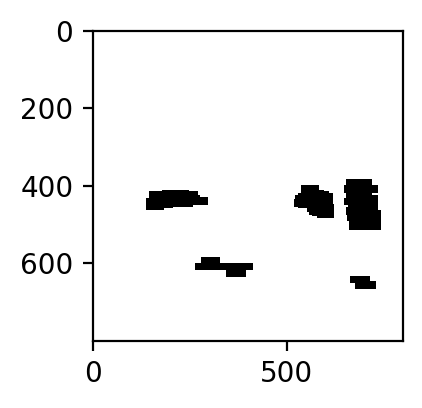

time: 509 ms


In [25]:
#plot prediction
 
road_img = gen_result_chart(prediction2[0])
fig, ax = plt.subplots(figsize=(2, 3))
#color_list = ['b', 'g', 'orange', 'c', 'm', 'y', 'k', 'w', 'r']
 
ax.imshow(road_img, cmap ='binary')

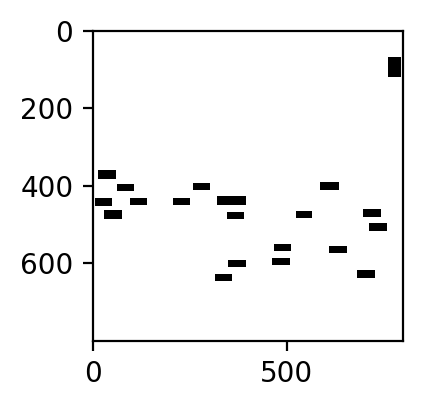

time: 544 ms


In [26]:
#plot target
 
road_img = gen_result_chart(targets [0])
fig, ax = plt.subplots(figsize = (2,3))
#color_list = ['b', 'g', 'orange', 'c', 'm', 'y', 'k', 'w', 'r']
 
ax.imshow(road_img, cmap ='binary')

In [40]:
torch.save({
            'epoch': num_epochs,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            #'loss': loss,
            
            }, "../models/fastRCNN_autoencode14epoch.pt")

time: 617 ms


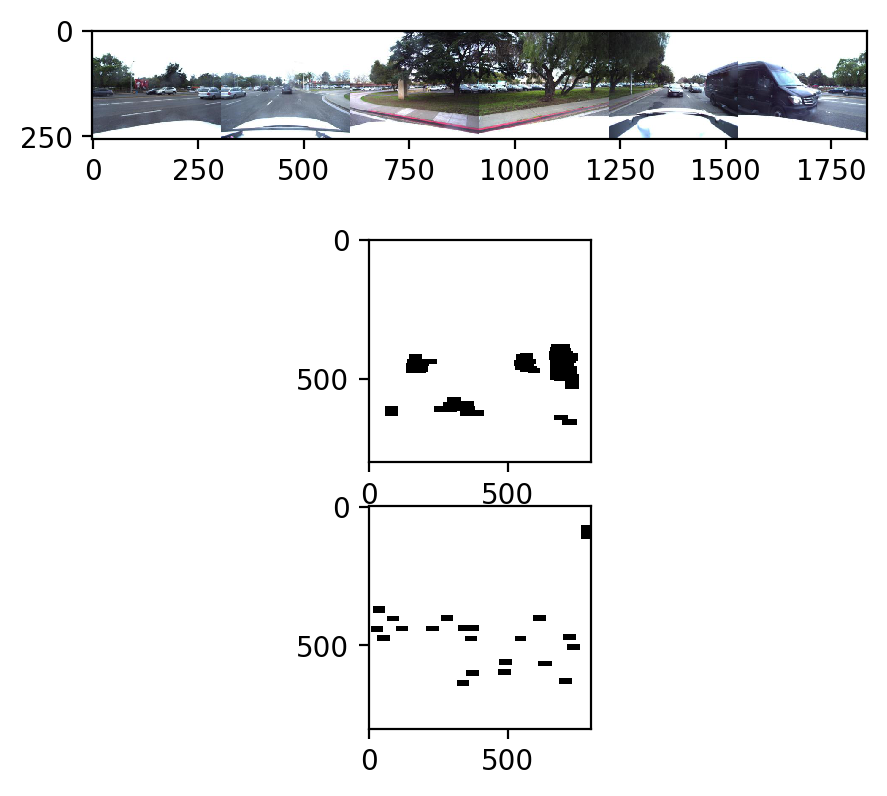

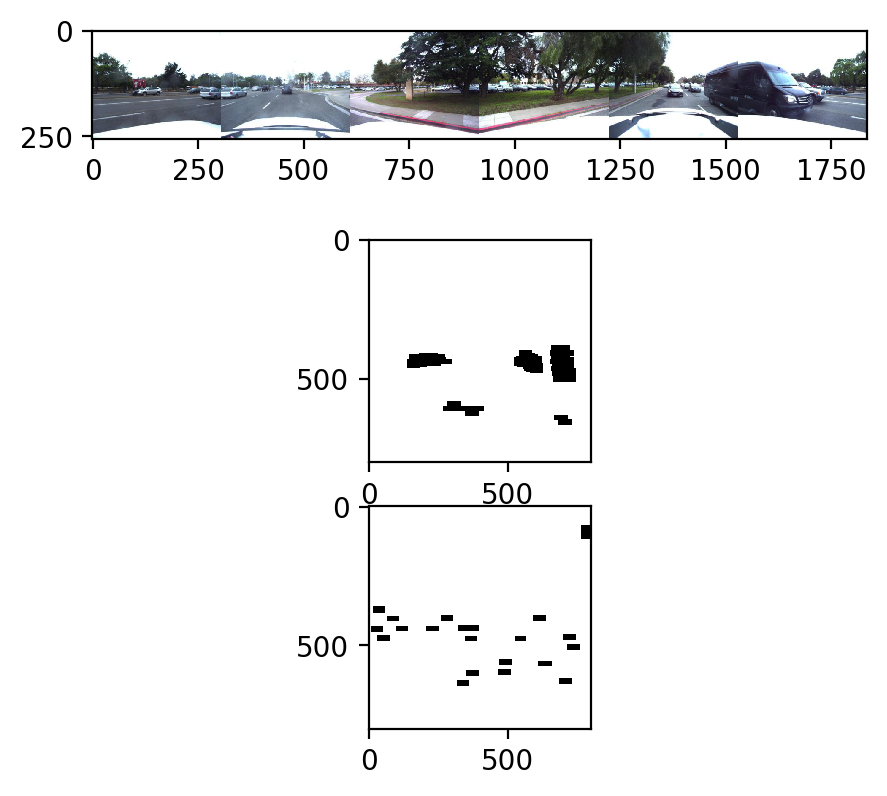

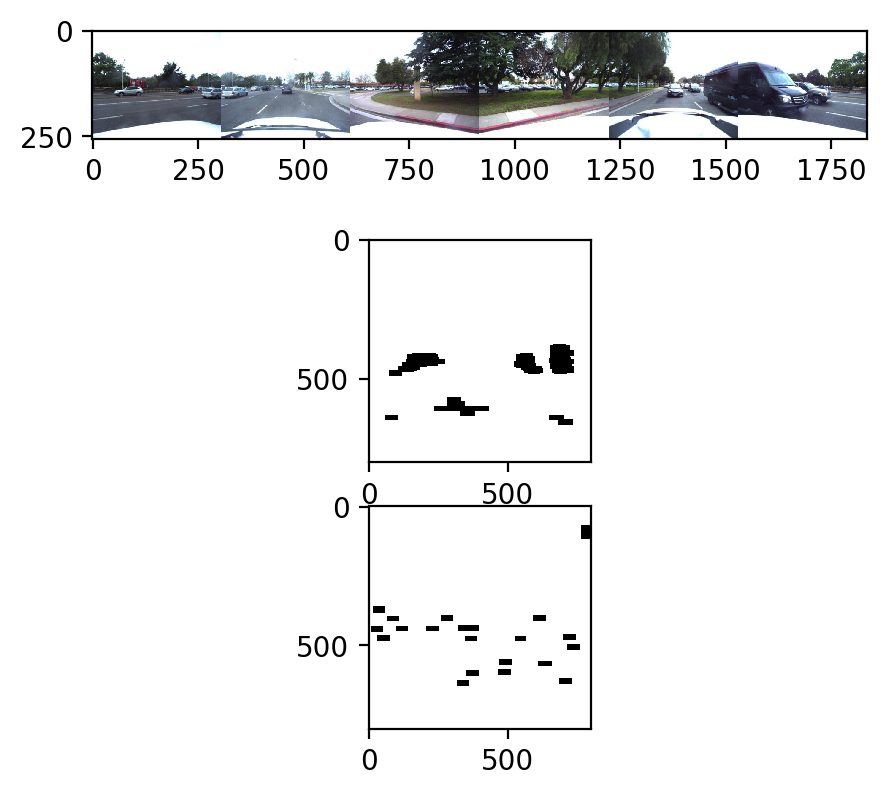

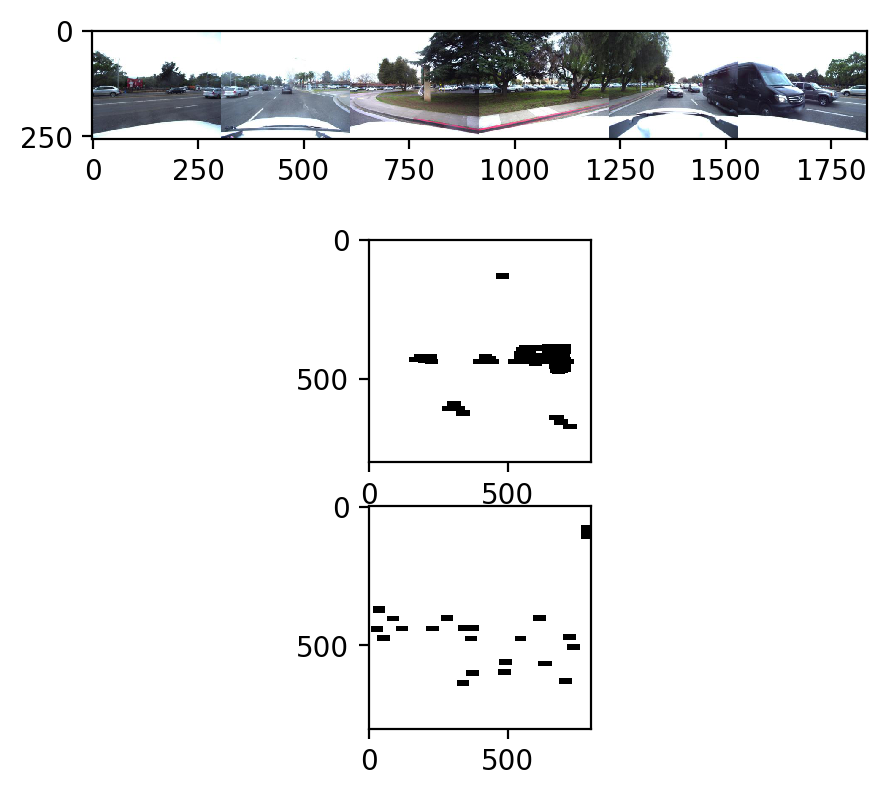

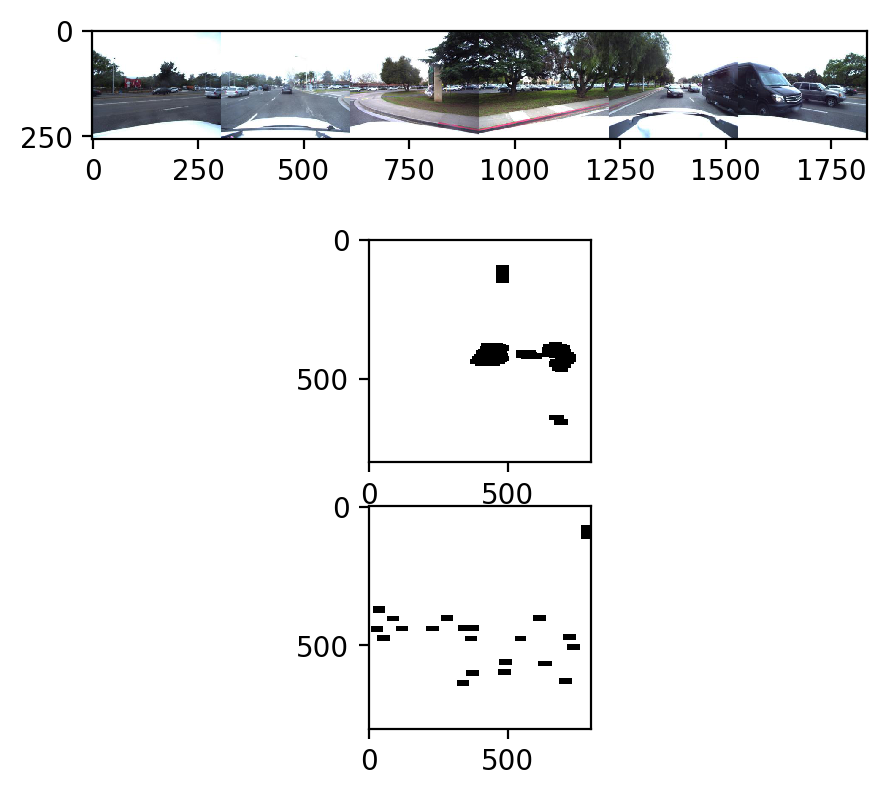

time: 9.47 s


In [39]:
to_img =  transforms.ToPILImage()
model.eval()
with torch.no_grad():
    for i ,(sample, target, road_image, extra) in  enumerate(val_data_loader):

        samp_pan = sew_images_panorm(sample) #convert to panoramic tensor
        samp_pan_t = torch.stack(samp_pan, dim = 0) #stack
        images = AE.return_image_tensor(samp_pan_t).to(device) #list of [3, 800, 800], should be 1 per patch
        targets = trans_target(old_targets)

        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        prediction_ = model(images)
    
        road_img = gen_result_chart(prediction_[0])
        
        sam_img = to_img(samp_pan[0])
        
        
        fig, (ax1, ax2, ax3) = plt.subplots(3, 1)
        ax1.imshow(sam_img)
        ax2.imshow(road_img, cmap ='binary')
        ax3.imshow(gen_result_chart(targets [0]), cmap='binary')
        
        if i == 4:
            break

In [46]:
val_labeled_scene_index

array([132, 121, 122, 114, 107, 119, 130, 118, 133])

time: 5.38 ms


In [47]:
transform = transforms.ToTensor()
scene_132DS = LabeledDataset(image_folder=image_folder,
                                  annotation_file=annotation_csv,
                                  scene_index=np.array([132]),
                                  transform=transform,
                                  extra_info=True
                                 )
s132_loader = torch.utils.data.DataLoader(scene_132DS , batch_size=5, shuffle=False, num_workers=2, collate_fn=collate_fn)

time: 385 ms


In [48]:
len(scene_132DS)

126

time: 4.57 ms


5


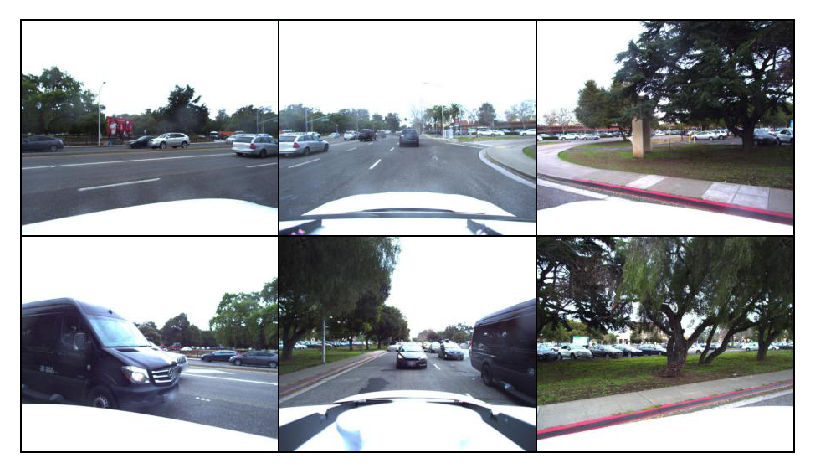

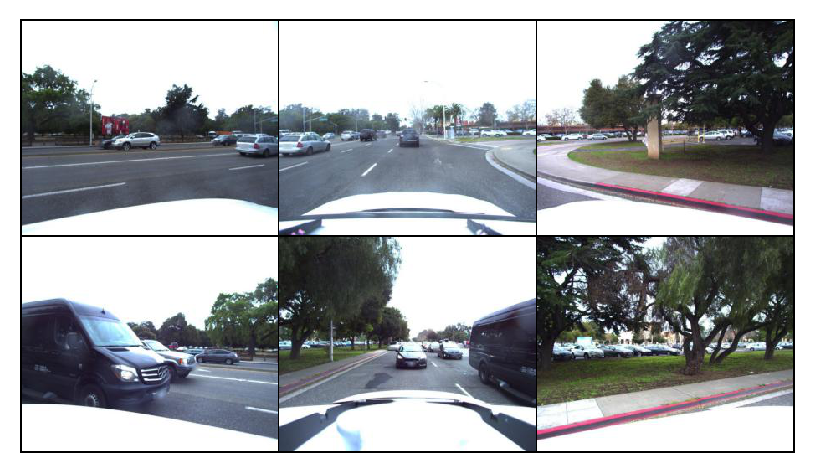

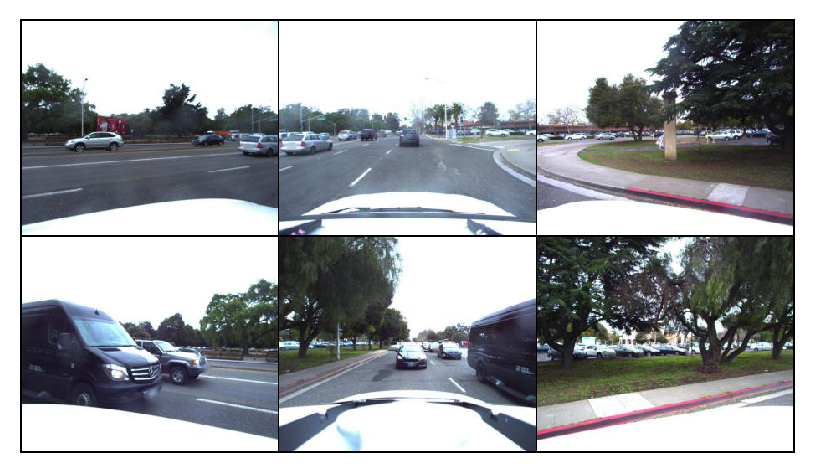

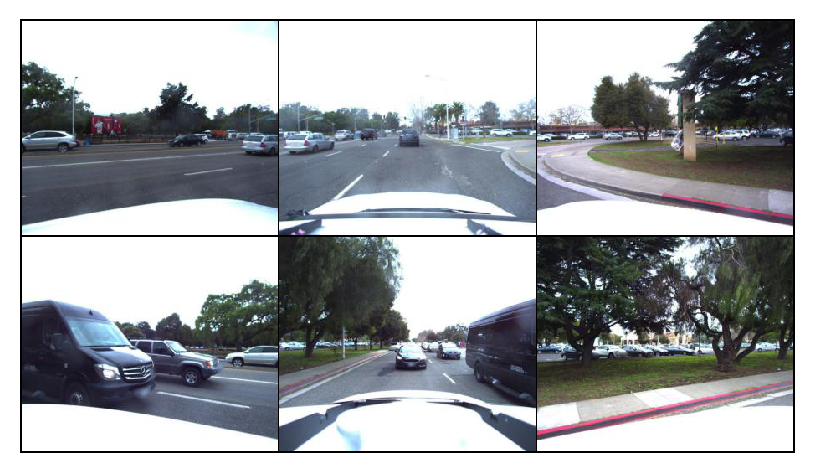

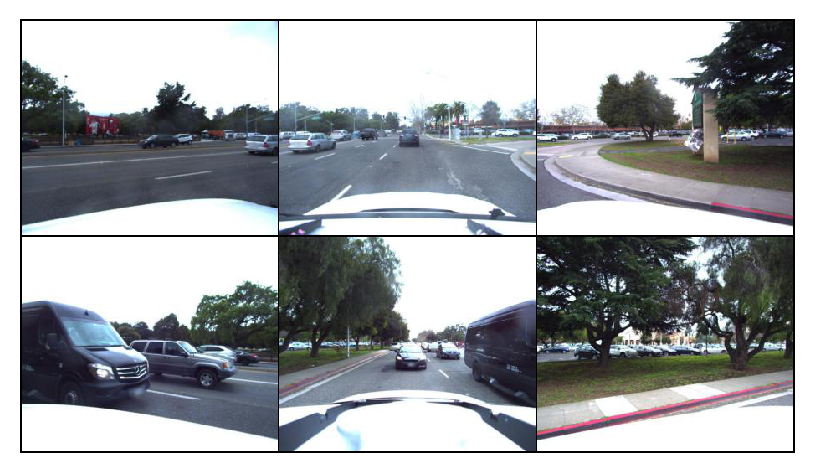

5


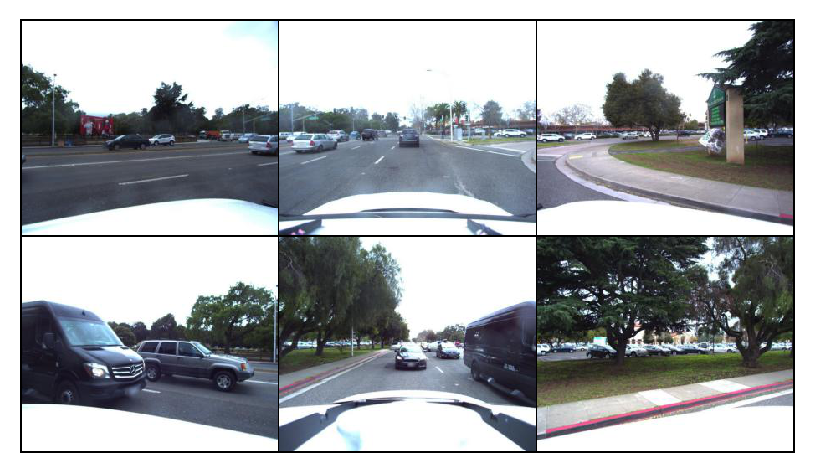

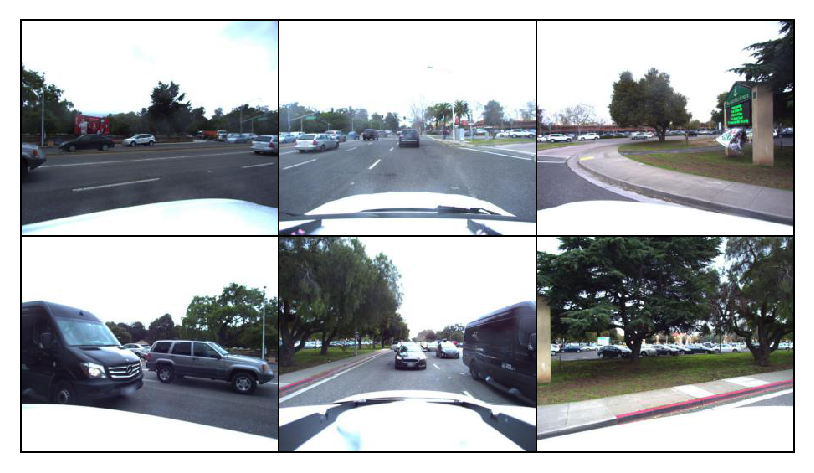

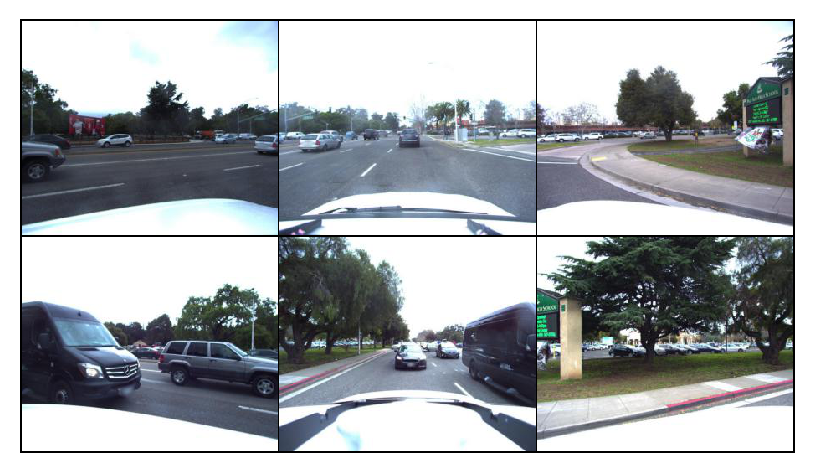

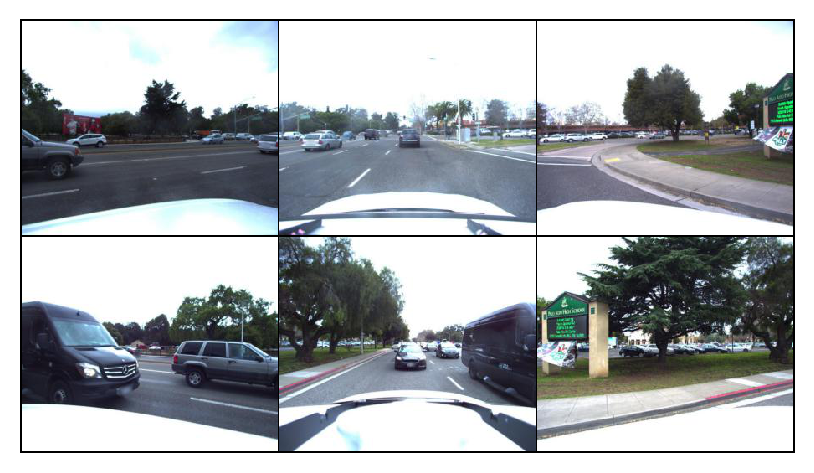

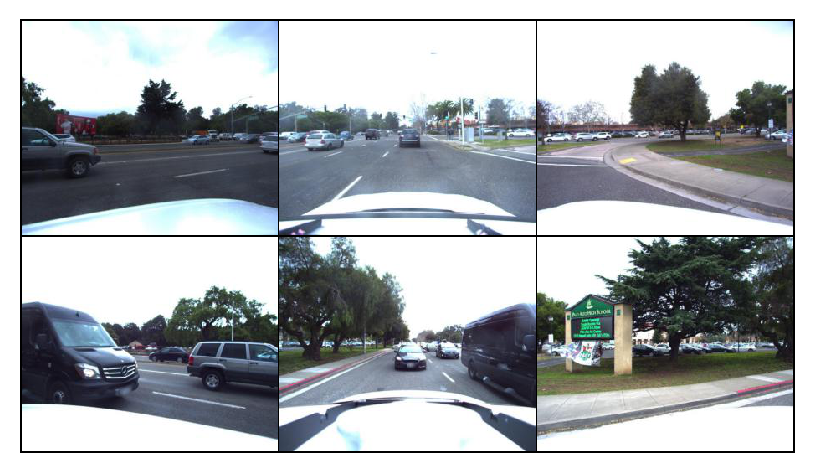

5


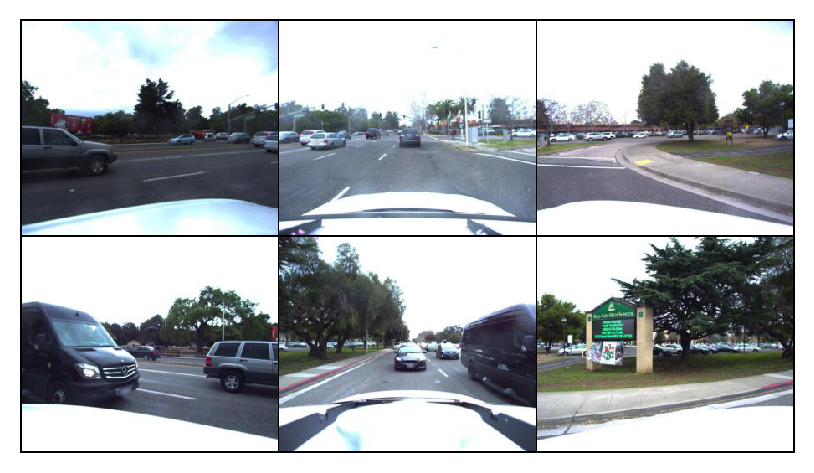

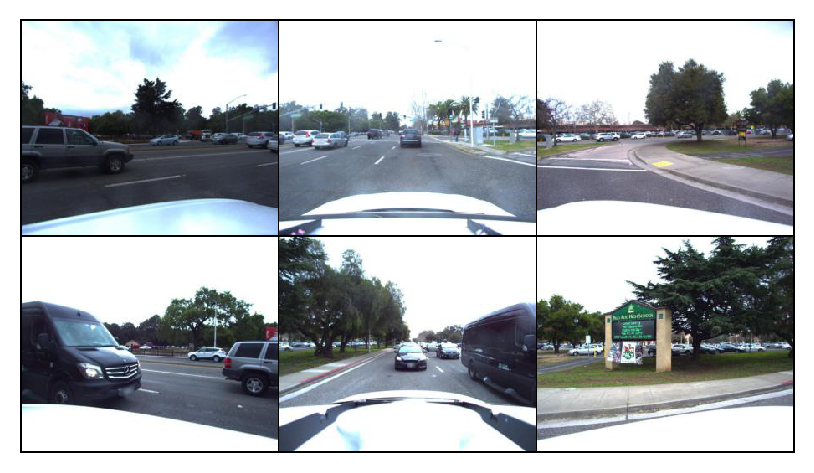

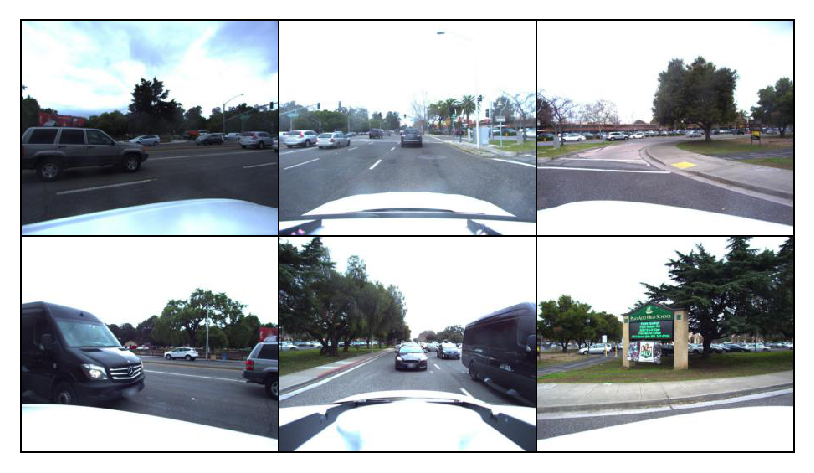

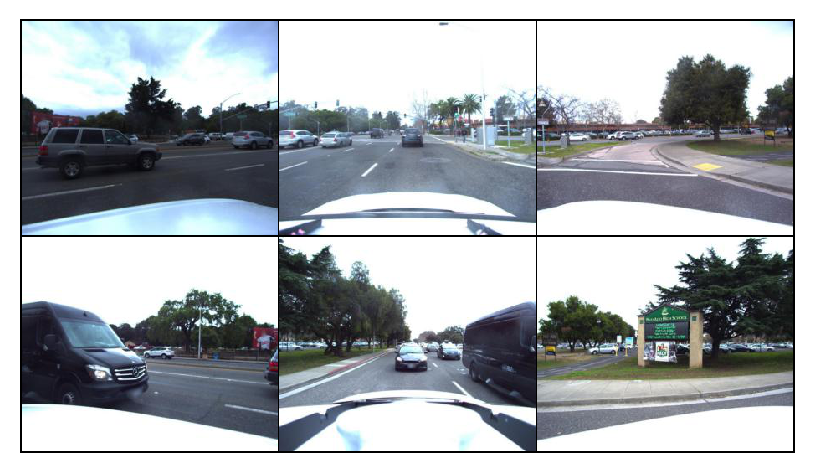

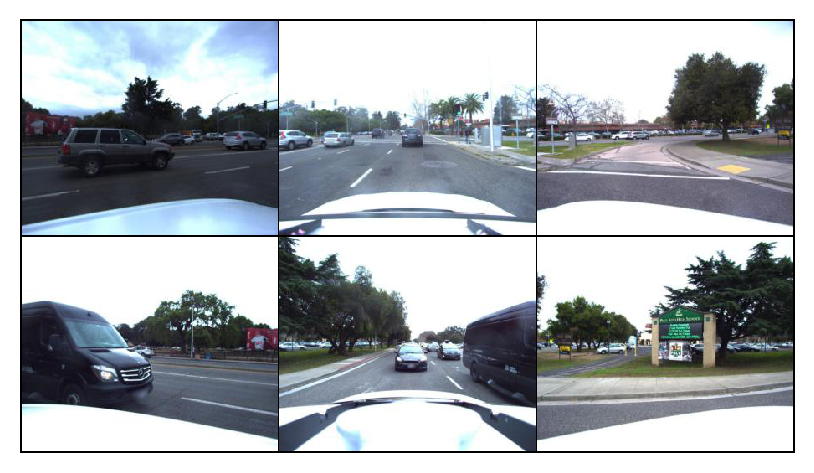

5


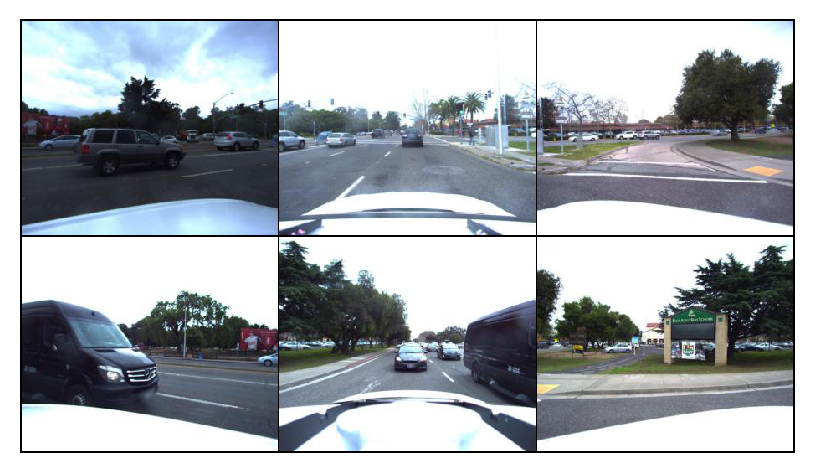

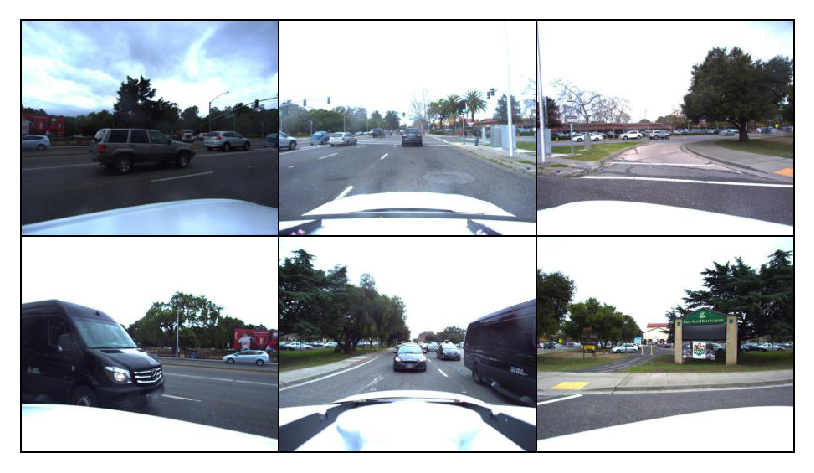

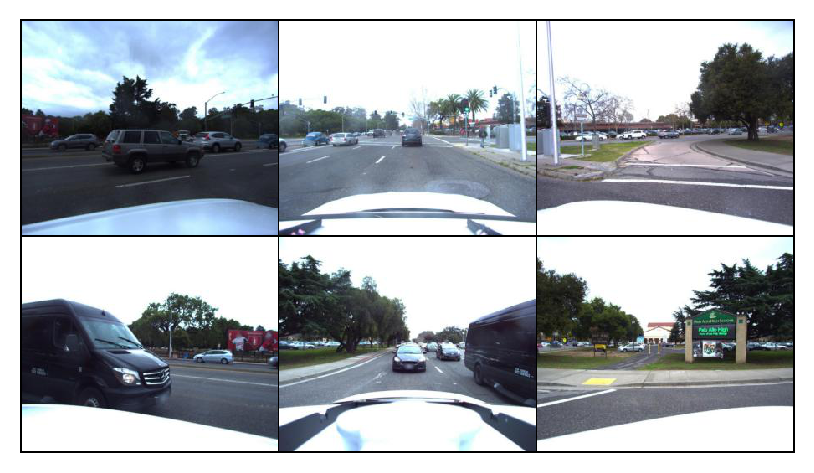

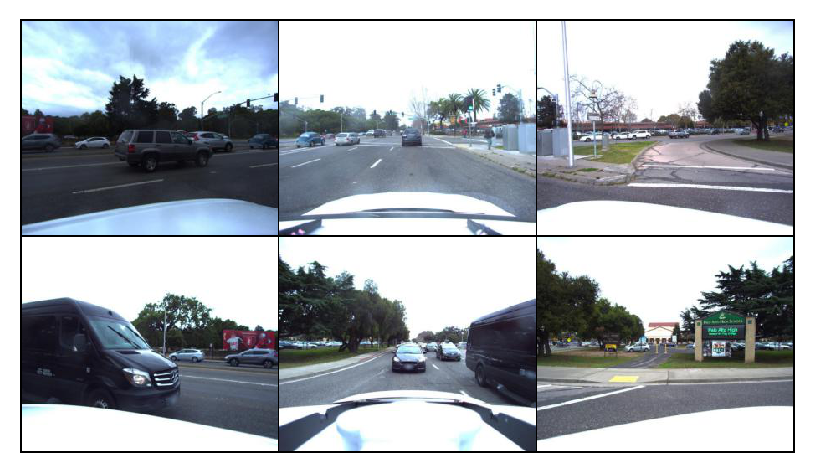

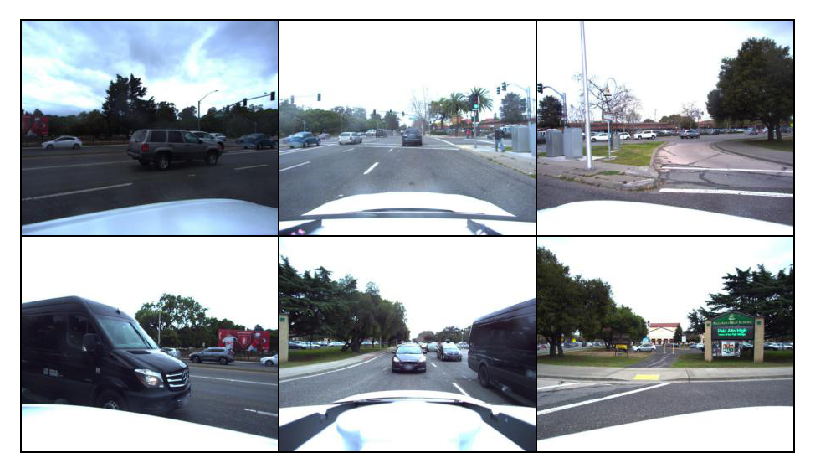

5


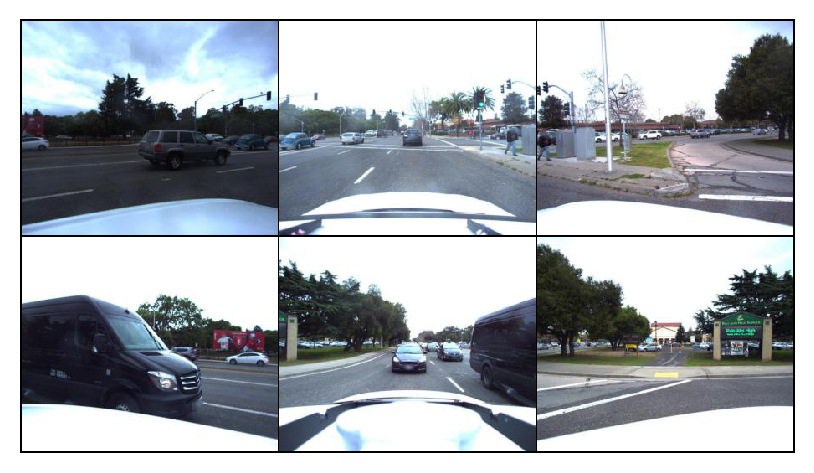

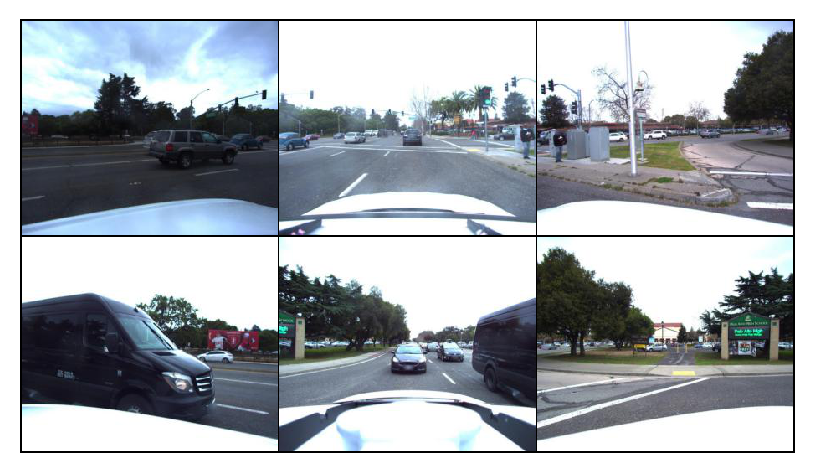

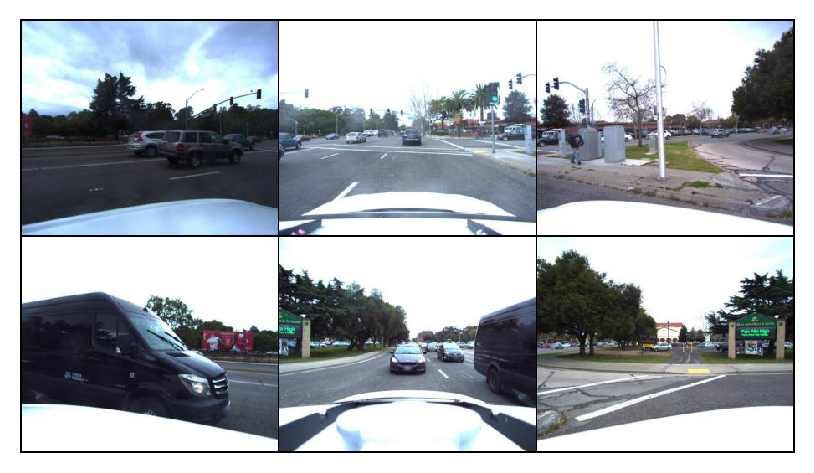

KeyboardInterrupt: 

time: 21.6 s


In [53]:
for i ,(sample, target, road_image, extra) in  enumerate(s132_loader):
    print(len(sample))
    for b in sample:
        plt.imshow(torchvision.utils.make_grid(b, nrow=3).numpy().transpose(1, 2, 0))
        plt.axis('off')
        plt.show()
    